In [1]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import simspace as ss

# Supp Fig. 1B: Runtime Analysis

In [2]:
import time

# Define grid sizes to test (e.g., 50x50, 75x75, 100x100, 150x150, 200x200)
grid_sizes = [(s, s) for s in [30, 50, 75, 100, 150, 200]]
runtimes = []

num_repeats = 10
mean_runtimes = []
std_runtimes = []

for shape in grid_sizes:
    times = []
    for i in range(num_repeats):
        start = time.time()
        param = ss.util.generate_random_parameters(n_group=2, n_state=8, seed=i)
        sim = ss.util.sim_from_params(
            param,
            shape=shape,
            num_iteration=4,
            n_iter=6,
            custom_neighbor=ss.spatial.generate_offsets(3, 'manhattan'),
            seed=0
        )
        end = time.time()
        times.append(end - start)
    mean_runtimes.append(np.mean(times))
    std_runtimes.append(np.std(times))
    print(f"Grid size {shape}: mean {np.mean(times):.2f} s, std {np.std(times):.2f} s")

Grid size (30, 30): mean 0.47 s, std 0.02 s
Grid size (50, 50): mean 1.33 s, std 0.05 s
Grid size (75, 75): mean 3.00 s, std 0.07 s
Grid size (100, 100): mean 5.39 s, std 0.18 s
Grid size (150, 150): mean 12.21 s, std 0.09 s
Grid size (200, 200): mean 21.88 s, std 0.13 s


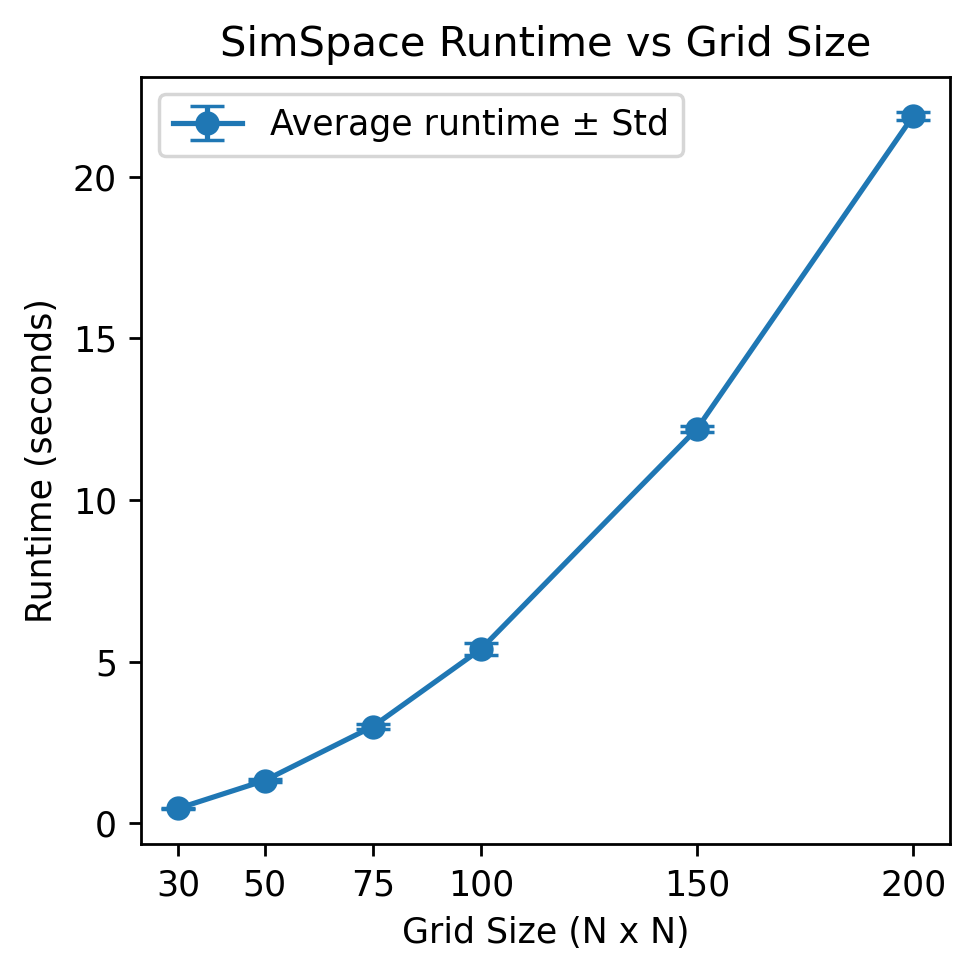

In [3]:
runtimes = mean_runtimes  # for plotting below

# Plot runtime vs grid size
plt.figure(figsize=(4, 4), dpi=250)
sizes = [s[0] for s in grid_sizes]
plt.errorbar(sizes, runtimes, yerr=std_runtimes, marker='o', capsize=5, label='Average runtime ± Std')
plt.legend()
plt.xlabel('Grid Size (N x N)')
plt.ylabel('Runtime (seconds)')
plt.title('SimSpace Runtime vs Grid Size')
plt.xticks(sizes)
plt.tight_layout()
plt.show()

# Supp Fig. 2A: more examples of reference-free simulations

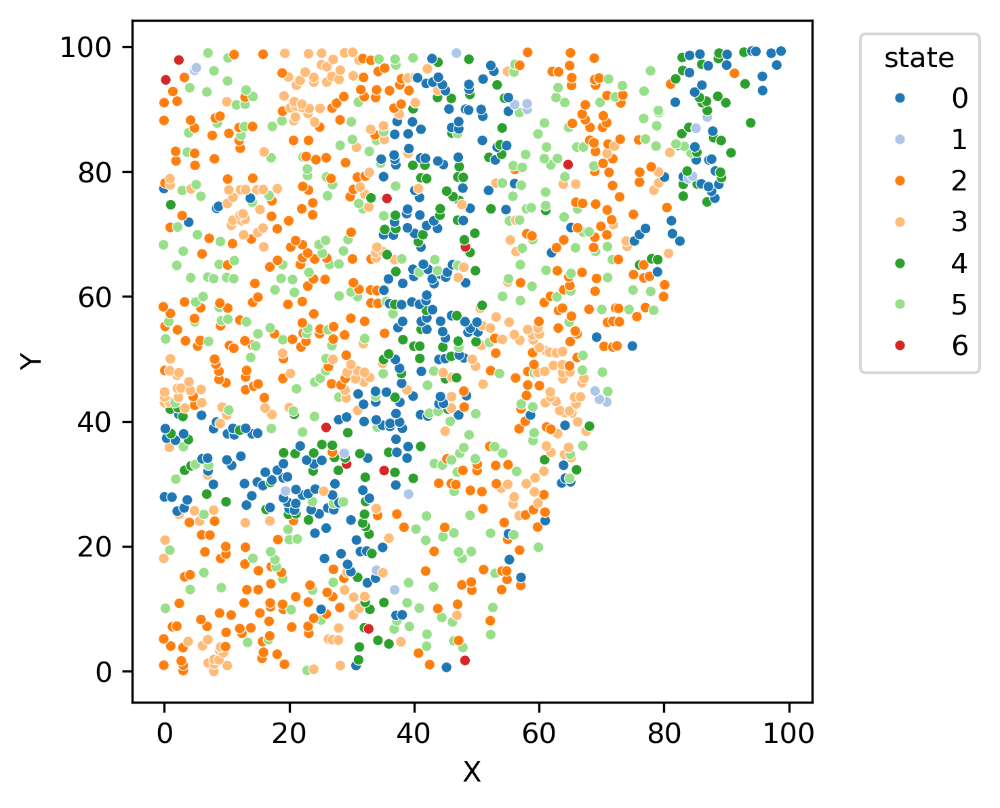

In [12]:
shape = (100, 100)
param_1 = ss.util.generate_random_parameters(n_group=2, n_state=7, seed=1)

n_group = param_1['n_group']
diag_length = len(param_1['theta_list'][0])
n_state = int((1 + np.sqrt(1 + 8 * diag_length)) / 2)
niche_theta = np.zeros((n_group, n_group))
niche_theta[np.triu_indices(n_group, 1)] = param_1['niche_theta']
niche_theta = niche_theta + niche_theta.T - np.diag(niche_theta.diagonal())
np.fill_diagonal(niche_theta, 1)

theta_list = []
for i in range(n_group):
    theta_tmp = np.zeros((n_state, n_state))
    theta_tmp[np.triu_indices(n_state, 1)] = param_1['theta_list'][i]
    theta_tmp = theta_tmp + theta_tmp.T - np.diag(theta_tmp.diagonal())
    np.fill_diagonal(theta_tmp, 1)
    theta_list.append(theta_tmp)

density_replicates = np.array(param_1['density_replicates'])
density_replicates[density_replicates < 0] = 0
phi_replicates = param_1['phi_replicates']

Sim = ss.SimSpace(
    shape = shape,
    num_states = n_state,
    num_iterations= 4,
    theta=theta_list,
    phi=phi_replicates,
    neighborhood=ss.spatial.generate_offsets(3, 'manhattan'), 
    random_seed=42,
    )
Sim.initialize()   # Initialize the grid
## Create niches and run simulation
Sim.create_niche(num_niches=n_group, n_iter=6, theta_niche=niche_theta)
## Create a trapezoid boundary in the grid, which takes half of the area
x, y = np.meshgrid(np.arange(shape[1]), np.arange(shape[0]))
boundary_mask = (y < ((shape[0] / shape[1]) * x * 2 - 100))  # Trapezoid boundary
Sim.grid[boundary_mask] = -1

Sim.gibbs_sampler()    # Gibbs sampling
Sim.density_sampler(density_replicates)  # Cell density of each niche
Sim.perturbation(step = 0.2)
Sim.plot(figsize=(5, 5), dpi=300, size=14)

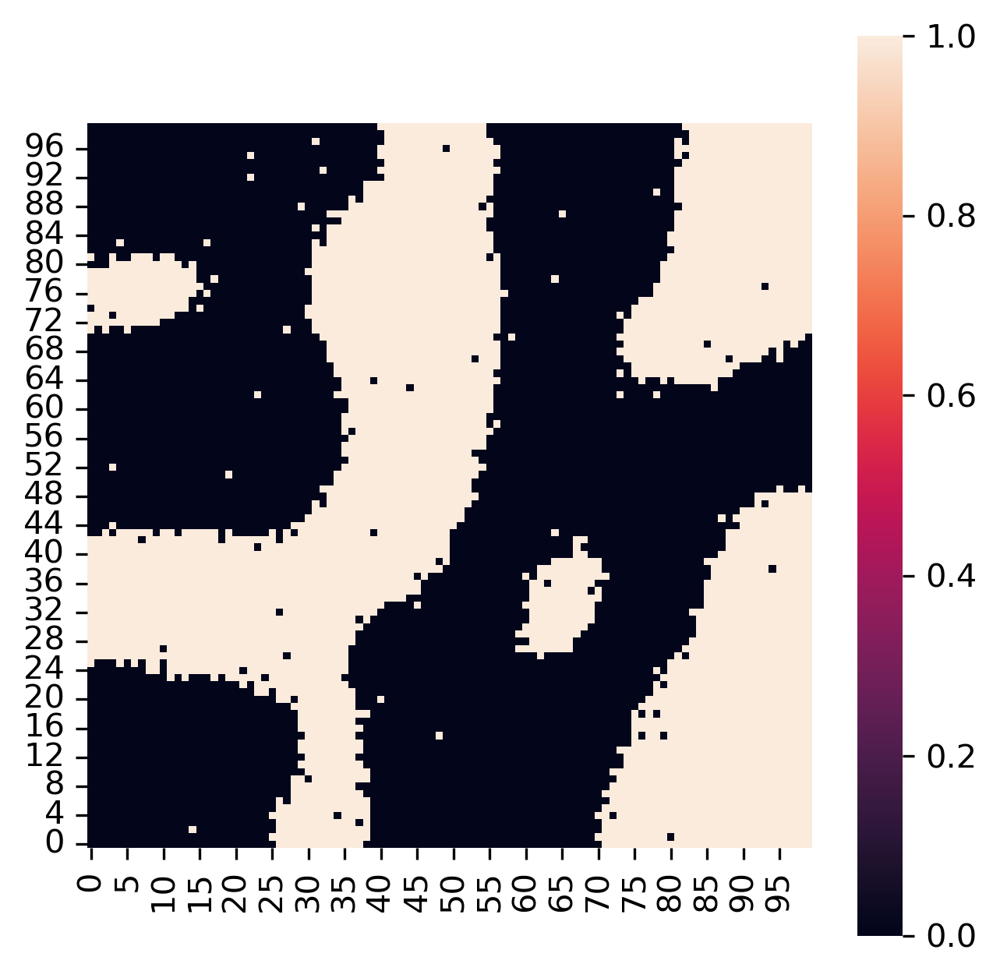

In [13]:
Sim.plot_niche(figsize=(5, 5), dpi=300)

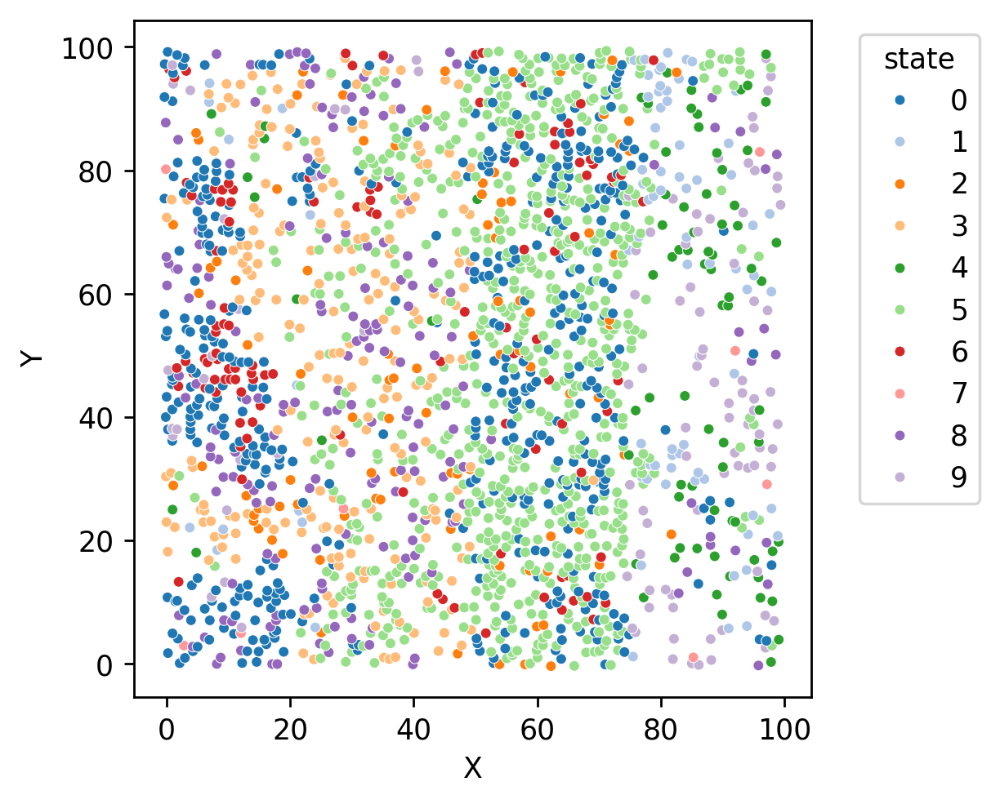

In [2]:
shape = (100, 100)
param_1 = ss.util.generate_random_parameters(n_group=4, n_state=10, seed=42)

n_group = param_1['n_group']
diag_length = len(param_1['theta_list'][0])
n_state = int((1 + np.sqrt(1 + 8 * diag_length)) / 2)
niche_theta = np.zeros((n_group, n_group))
niche_theta[np.triu_indices(n_group, 1)] = param_1['niche_theta']
niche_theta = niche_theta + niche_theta.T - np.diag(niche_theta.diagonal())
np.fill_diagonal(niche_theta, 1)

theta_list = []
for i in range(n_group):
    theta_tmp = np.zeros((n_state, n_state))
    theta_tmp[np.triu_indices(n_state, 1)] = param_1['theta_list'][i]
    theta_tmp = theta_tmp + theta_tmp.T - np.diag(theta_tmp.diagonal())
    np.fill_diagonal(theta_tmp, 1)
    theta_list.append(theta_tmp)

density_replicates = np.array(param_1['density_replicates'])
density_replicates[density_replicates < 0] = 0
phi_replicates = param_1['phi_replicates']

Sim = ss.SimSpace(
    shape = shape,
    num_states = n_state,
    num_iterations= 4,
    theta=theta_list,
    phi=phi_replicates,
    neighborhood=ss.spatial.generate_offsets(3, 'manhattan'), 
    random_seed=42,
    )
Sim.initialize()   # Initialize the grid
## Create niches and run simulation
Sim.manual_niche(
    pattern = {'domain_1': ['rectangle', [50, 12, 100, 25]],
               'domain_2': ['rectangle', [50, 37, 100, 25]],
               'domain_3': ['rectangle', [50, 62, 100, 25]]},
)

Sim.gibbs_sampler()    # Gibbs sampling
Sim.density_sampler(density_replicates)  # Cell density of each niche
Sim.perturbation(step = 0.2)
Sim.plot(figsize=(5, 5), dpi=250, size=14)

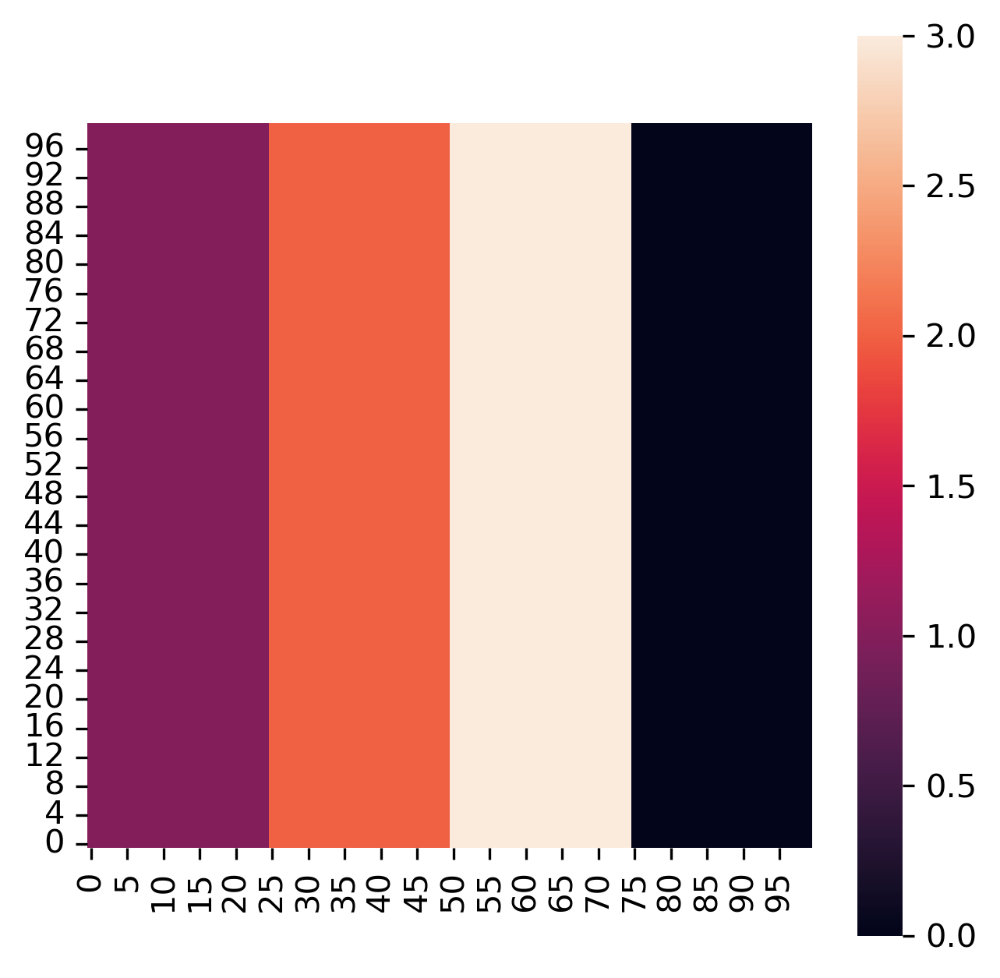

In [15]:
## Plot niche map, which is layered rectangle niches
Sim.plot_niche(figsize=(5, 5), dpi=300)

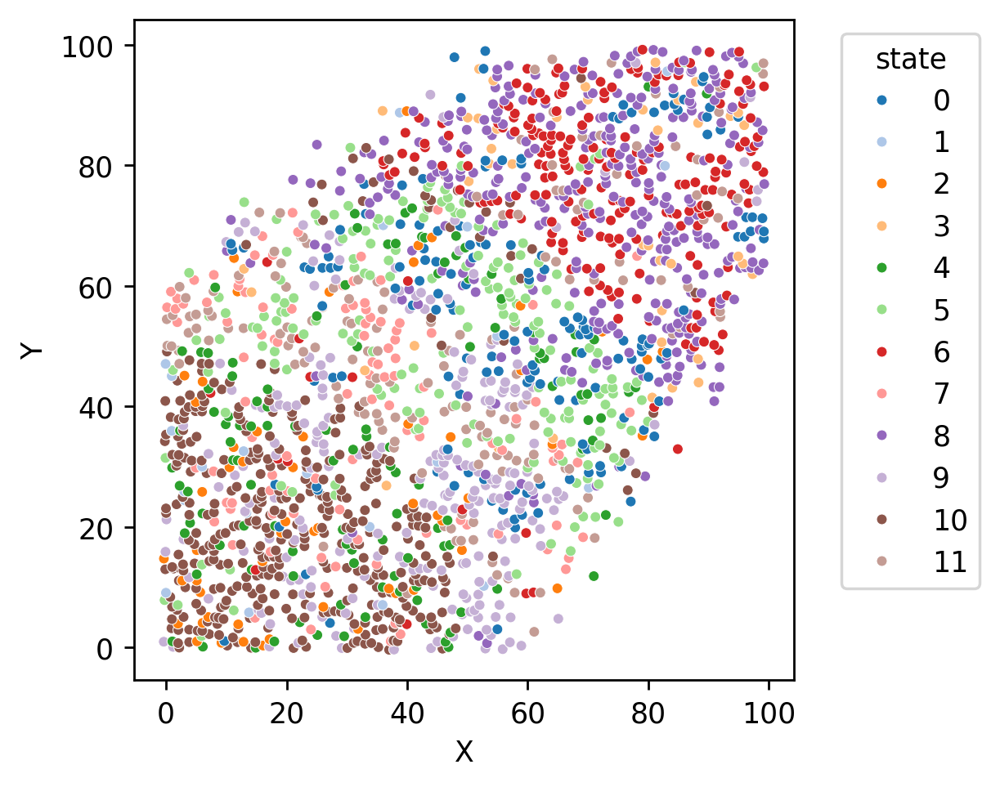

In [32]:
shape = (100, 100)
param_1 = ss.util.generate_random_parameters(n_group=4, n_state=12, seed=42)

n_group = param_1['n_group']
diag_length = len(param_1['theta_list'][0])
n_state = int((1 + np.sqrt(1 + 8 * diag_length)) / 2)
niche_theta = np.zeros((n_group, n_group))
niche_theta[np.triu_indices(n_group, 1)] = param_1['niche_theta']
niche_theta = niche_theta + niche_theta.T - np.diag(niche_theta.diagonal())
np.fill_diagonal(niche_theta, 1)

theta_list = []
for i in range(n_group):
    theta_tmp = np.zeros((n_state, n_state))
    theta_tmp[np.triu_indices(n_state, 1)] = param_1['theta_list'][i]
    theta_tmp = theta_tmp + theta_tmp.T - np.diag(theta_tmp.diagonal())
    np.fill_diagonal(theta_tmp, 1)
    theta_list.append(theta_tmp)

density_replicates = np.array(param_1['density_replicates'])
density_replicates[density_replicates < 0] = 0
phi_replicates = param_1['phi_replicates']

Sim = ss.SimSpace(
    shape = shape,
    num_states = n_state,
    num_iterations= 4,
    theta=theta_list,
    phi=phi_replicates,
    neighborhood=ss.spatial.generate_offsets(3, 'manhattan'), 
    random_seed=42,
    )
Sim.initialize() 

## Create a trapezoid boundary in the grid, which takes half of the area
x, y = np.meshgrid(np.arange(shape[1]), np.arange(shape[0]))
# create an ellipse mask for the boundary, which covers (0, 0) to (90, 90)
random_noise = np.random.normal(0, 5, size=shape)
boundary_mask = ((y+x+random_noise) / 200) ** 2 + ((y-x+random_noise)/60) ** 2 > 1
Sim.grid[boundary_mask] = -1

## Create niches and run simulation
Sim.manual_niche(
    pattern = {'domain_1': ['ellipse', [0, 0, 50, 50, 0]],
               'domain_2': ['ellipse', [0, 0, 75, 75, 0]],
               'domain_3': ['ellipse', [0, 0, 90, 90, 0]],
               },
)

Sim.gibbs_sampler()    # Gibbs sampling
Sim.density_sampler(density_replicates)  # Cell density of each niche
Sim.perturbation(step = 0.2)
Sim.plot(figsize=(5, 5), dpi=250, size=14)

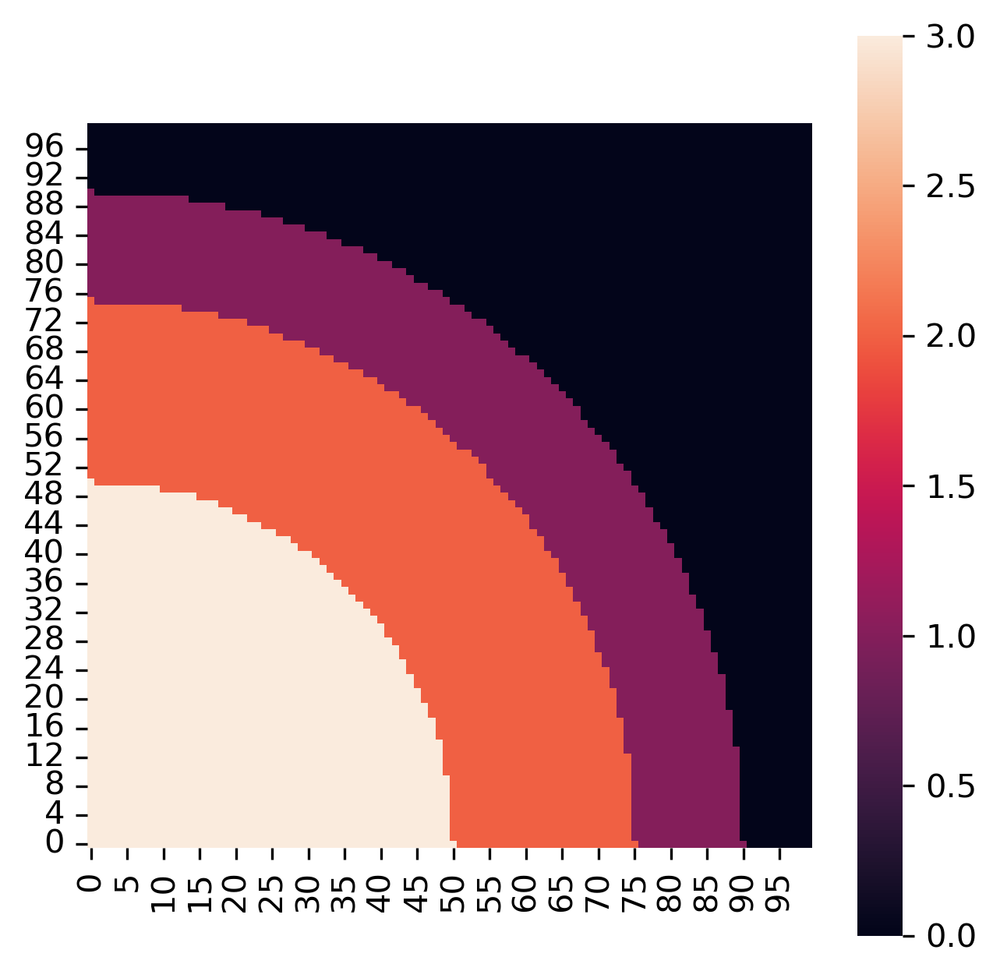

In [17]:
## Plot customized niche map, which is layered ellipse niches
Sim.plot_niche(figsize=(5, 5), dpi=300)

In [124]:
Sim.create_omics(n_genes=1000, bg_ratio=0.2, bg_param = (1, 0.5), marker_param = (3.5, 1.6), spatial=False)
Sim.gene_meta['Type_8'][0] = 7
Sim.gene_meta['Type_5'][0] = 5.2
Sim.gene_meta['Type_0'][0] = 5
Sim.gene_meta['Type_7'][0] = 3.5
Sim.gene_meta['Type_9'][0] = 3.5
Sim.gene_meta['Type_10'][0] = 2.5
Sim.omics = ss.omics.simOmics(
    omics_meta=Sim.gene_meta, 
    meta=Sim.meta, 
    seed=Sim.seed,
    )

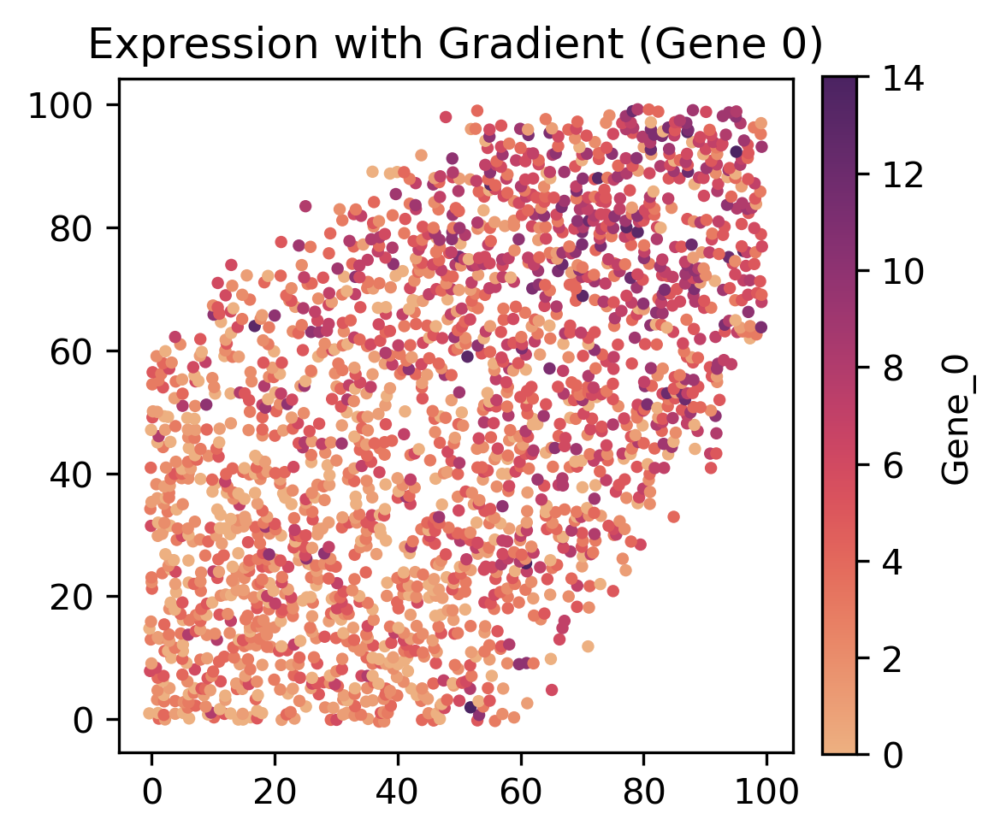

In [181]:
ss.plot.plot_gene(
    Sim.meta, Sim.omics['Gene_0'], size=12, 
    figsize=(4, 4), dpi=300, title='Expression with Gradient (Gene 0)',)

In [160]:
plt_data = pd.DataFrame({
    'x': Sim.meta['row'],
    'y': Sim.meta['col'],
    'type': Sim.meta['state'],
    'Gene_0': Sim.omics['Gene_0'],
})
# distance along the y=x axis from the origin (non-negative)
plt_data['axis_dist'] = np.abs((plt_data['x'] + plt_data['y']) / np.sqrt(2))
# np.random.seed(42)
# plt_data['Gene_0'] += np.random.normal(0, 0.5, size=plt_data.shape[0])

Text(0.5, 1.0, 'Gene 0 Expression vs Distance along y=x axis')

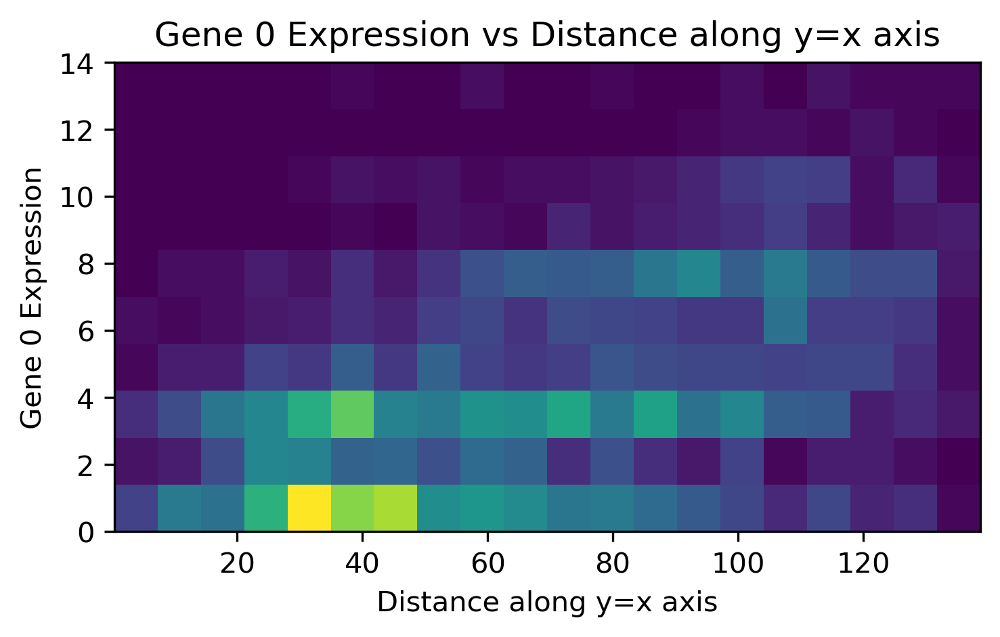

In [185]:
plt.figure(figsize=(5.5,3), dpi=300)
plt.hist2d(
    data=plt_data, 
    x='axis_dist', 
    y='Gene_0', 
    bins=[20, 10]
)
plt.xlabel('Distance along y=x axis')
plt.ylabel('Gene 0 Expression')
plt.title('Gene 0 Expression vs Distance along y=x axis')

# Supp Fig. 2B: Cell Type Interaction Score

In [2]:
def ss_statistics(
        shape = (100, 100), 
        n_group = 3, 
        n_state = 9, 
        num_iteration = 4, 
        n_iter = 6, 
        custom_neighbor = ss.spatial.generate_offsets(3, 'manhattan'),
        seed = 0,   
    ):
    param_1 = ss.util.generate_random_parameters(n_group=n_group, n_state=n_state, seed=seed)
    sim1 = ss.util.sim_from_params(
        param_1,
        shape=shape,
        num_iteration=num_iteration,
        n_iter=n_iter,
        custom_neighbor=custom_neighbor,
        seed=seed
    )  
    ci_sim = ss.spatial.calculate_interaction_score(sim1.meta['state'], sim1.meta[['row', 'col']], sim1.meta['state'].unique().tolist())

    return [ci_sim]

In [ ]:
sim_stats_list = []
Xenium_stats_list = []
merfish_stats_list = []
sccube_stats_list = []
SRTsim_stats_list = []
scMultiSim_stats_list = []
for i in range(8):
    ## SimSpace
    sim_stats = ss_statistics(
        shape=(100, 100), n_group=2, n_state=9, num_iteration=4, n_iter=6, 
        custom_neighbor=ss.spatial.generate_offsets(3, 'manhattan'), seed=i)
    sim_stats_list.append(sim_stats)
    ## Xenium
    tile_path = f'../fig_data/MI/tile_{i}.csv'
    cells = pd.read_csv(tile_path, index_col=None)
    cells['x_centroid'] = (cells['x_centroid'] - cells['x_centroid'].min()) / (cells['x_centroid'].max() - cells['x_centroid'].min()) * 100
    cells['y_centroid'] = (cells['y_centroid'] - cells['y_centroid'].min()) / (cells['y_centroid'].max() - cells['y_centroid'].min()) * 100
    ci_sim = ss.spatial.calculate_interaction_score(cells['Cluster'], cells[['x_centroid', 'y_centroid']], cells['Cluster'].unique().tolist())
    Xenium_stats_list.append([ci_sim])
    ## scCube
    tile_path = f'../fig_data/MI/sc_meta_{i}.csv'
    cells = pd.read_csv(tile_path, index_col=None)
    cells['point_x'] = (cells['point_x'] - cells['point_x'].min()) / (cells['point_x'].max() - cells['point_x'].min()) * 100
    cells['point_y'] = (cells['point_y'] - cells['point_y'].min()) / (cells['point_y'].max() - cells['point_y'].min()) * 100
    ci_sim = ss.spatial.calculate_interaction_score(cells['Cell_type'], cells[['point_x', 'point_y']], cells['Cell_type'].unique().tolist())
    sccube_stats_list.append([ci_sim])
    ## SRTsim   
    tile_path = f'../fig_data/SRTsim/ref_free_{i}.csv'
    cells = pd.read_csv(tile_path, index_col=None)
    cells['x'] = (cells['x'] - cells['x'].min()) / (cells['x'].max() - cells['x'].min()) * 100
    cells['y'] = (cells['y'] - cells['y'].min()) / (cells['y'].max() - cells['y'].min()) * 100
    ci_sim = ss.spatial.calculate_interaction_score(cells['group'], cells[['x', 'y']], cells['group'].unique().tolist())
    SRTsim_stats_list.append([ci_sim])
    ## scMultiSim
    tile_path = f'../fig_data/scMultiSim/spatial_sim_{i}.csv'
    cells = pd.read_csv(tile_path, index_col=None)
    cells['x'] = (cells['x'] - cells['x'].min()) / (cells['x'].max() - cells['x'].min()) * 100
    cells['y'] = (cells['y'] - cells['y'].min()) / (cells['y'].max() - cells['y'].min()) * 100
    ci_sim = ss.spatial.calculate_interaction_score(cells['cell.type'], cells[['x', 'y']], cells['cell.type'].unique().tolist())
    scMultiSim_stats_list.append([ci_sim])
    ## MERFISH
    tile_path = f'../fig_data/MERFISH/merfish_data_sample_{i}.csv'
    cells = pd.read_csv(tile_path, index_col=None)
    cells['Centroid_X'] = (cells['Centroid_X'] - cells['Centroid_X'].min()) / (cells['Centroid_X'].max() - cells['Centroid_X'].min()) * 100
    cells['Centroid_Y'] = (cells['Centroid_Y'] - cells['Centroid_Y'].min()) / (cells['Centroid_Y'].max() - cells['Centroid_Y'].min()) * 100
    ci_sim = ss.spatial.calculate_interaction_score(cells['Cell_class'], cells[['Centroid_X', 'Centroid_Y']], cells['Cell_class'].unique().tolist())
    merfish_stats_list.append([ci_sim])

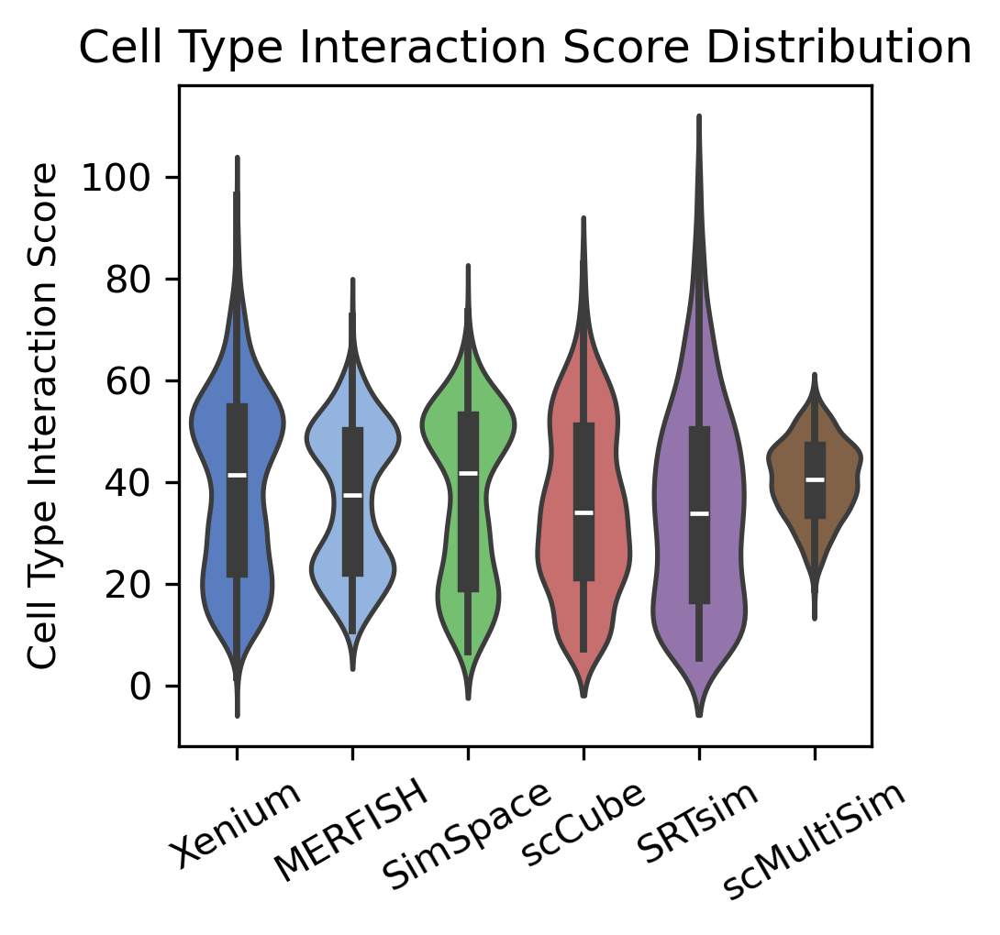

In [7]:
## Cell Type Interaction
sim_ci = np.sort(np.concatenate([item[0].values.reshape(-1).tolist() for item in sim_stats_list]))
xenium_ci = np.sort(np.concatenate([item[0].values.reshape(-1).tolist() for item in Xenium_stats_list]))
sccube_ci = np.sort(np.concatenate([item[0].values.reshape(-1).tolist() for item in sccube_stats_list]))
srt_ci = np.sort(np.concatenate([item[0].values.reshape(-1).tolist() for item in SRTsim_stats_list]))
scMultiSim_ci = np.sort(np.concatenate([item[0].values.reshape(-1).tolist() for item in scMultiSim_stats_list]))
merfish_ci = np.sort(np.concatenate([item[0].values.reshape(-1).tolist() for item in merfish_stats_list]))

# Prepare data for violin plots
ci_labels = ['Xenium', 'MERFISH', 'SimSpace', 'scCube', 'SRTsim', 'scMultiSim']
ci_data = [
    xenium_ci, merfish_ci, sim_ci, sccube_ci, srt_ci, scMultiSim_ci
]
ci_labels = ci_labels

palette = sns.color_palette("muted", 6)
palette = list(palette)
first = np.array(palette[0])
# blend the first color toward a light blue and set as the second color
palette[1] = tuple(np.clip(first * 0.4 + np.array([0.7, 0.85, 1.0]) * 0.6, 0, 1))

plt.figure(figsize=(3.5, 3.5), dpi=300)
sns.violinplot(data=ci_data, palette=palette)
plt.xticks(ticks=np.arange(len(ci_labels)), labels=ci_labels, rotation=30, ha='center')
plt.ylabel('Cell Type Interaction Score')
plt.title('Cell Type Interaction Score Distribution')
plt.tight_layout()
plt.show()

# Supp Fig. 3A: Sensitivity analysis on phi parameters in reference-free setting

In [4]:
def ss_statistics_phi(
        shape = (100, 100), 
        n_group = 3, 
        n_state = 9, 
        num_iteration = 4, 
        n_iter = 6, 
        custom_neighbor = ss.spatial.generate_offsets(3, 'manhattan'),
        seed = 0,   
        phi = 5,
    ):
    param_1 = ss.util.generate_random_parameters(n_group=n_group, n_state=n_state, seed=seed)
    param_1['phi_replicates'] = phi

    sim1 = ss.util.sim_from_params(
        param_1,
        shape=shape,
        num_iteration=num_iteration,
        n_iter=n_iter,
        custom_neighbor=custom_neighbor,
        seed=seed
    )  

    mi_sim = ss.spatial.integrate_morans_I(sim1.meta['state'], sim1.meta[['row', 'col']], sim1.meta['state'].unique().tolist())
    gc_sim = ss.spatial.integrate_gearys_C(sim1.meta['state'], sim1.meta[['row', 'col']], sim1.meta['state'].unique().tolist())
    ci_sim = ss.spatial.calculate_interaction_score(sim1.meta['state'], sim1.meta[['row', 'col']], sim1.meta['state'].unique().tolist())

    return [mi_sim, gc_sim, ci_sim]

In [5]:
phi_list = [1, 2, 3, 4, 4.5, 5, 6, 7, 8]
sim_phi_mi = [[] for _ in range(9)]
sim_phi_gc = [[] for _ in range(9)]
sim_phi_ci = [[] for _ in range(9)]

for i in range(9):
    for j in range(8):
        ## SimSpace
        sim_stats = ss_statistics_phi(
            shape=(100, 100), n_group=2, n_state=9, num_iteration=4, n_iter=6, 
            custom_neighbor=ss.spatial.generate_offsets(3, 'manhattan'), seed=j,
            phi=phi_list[i])
        sim_phi_mi[i].append(sim_stats[0])
        sim_phi_gc[i].append(sim_stats[1])
        sim_phi_ci[i].append(sim_stats[2].values.reshape(-1).tolist())

sim_phi_mi = [np.concatenate(item) for item in sim_phi_mi]
sim_phi_gc = [np.concatenate(item) for item in sim_phi_gc]
sim_phi_ci = [np.concatenate(item) for item in sim_phi_ci]

In [6]:
Xenium_mi_sim = []
Xenium_gc_sim = []
Xenium_ci_sim = []
merfish_mi_sim = []
merfish_gc_sim = []
merfish_ci_sim = []

for i in range(8):
    ## Xenium
    tile_path = f'../fig_data/MI/tile_{i}.csv'
    cells = pd.read_csv(tile_path, index_col=None)
    cells['x_centroid'] = (cells['x_centroid'] - cells['x_centroid'].min()) / (cells['x_centroid'].max() - cells['x_centroid'].min()) * 100
    cells['y_centroid'] = (cells['y_centroid'] - cells['y_centroid'].min()) / (cells['y_centroid'].max() - cells['y_centroid'].min()) * 100
    mi_sim = ss.spatial.integrate_morans_I(cells['Cluster'], cells[['x_centroid', 'y_centroid']], cells['Cluster'].unique().tolist())
    gc_sim = ss.spatial.integrate_gearys_C(cells['Cluster'], cells[['x_centroid', 'y_centroid']], cells['Cluster'].unique().tolist())
    ci_sim = ss.spatial.calculate_interaction_score(cells['Cluster'], cells[['x_centroid', 'y_centroid']], cells['Cluster'].unique().tolist())
    Xenium_mi_sim.append(mi_sim)
    Xenium_gc_sim.append(gc_sim)
    Xenium_ci_sim.append(ci_sim.values.reshape(-1).tolist())
    ## MERFISH
    tile_path = f'../fig_data/MERFISH/merfish_data_sample_{i}.csv'
    cells = pd.read_csv(tile_path, index_col=None)
    cells['Centroid_X'] = (cells['Centroid_X'] - cells['Centroid_X'].min()) / (cells['Centroid_X'].max() - cells['Centroid_X'].min()) * 100
    cells['Centroid_Y'] = (cells['Centroid_Y'] - cells['Centroid_Y'].min()) / (cells['Centroid_Y'].max() - cells['Centroid_Y'].min()) * 100
    mi_sim = ss.spatial.integrate_morans_I(cells['Cell_class'], cells[['Centroid_X', 'Centroid_Y']], cells['Cell_class'].unique().tolist())
    gc_sim = ss.spatial.integrate_gearys_C(cells['Cell_class'], cells[['Centroid_X', 'Centroid_Y']], cells['Cell_class'].unique().tolist())
    ci_sim = ss.spatial.calculate_interaction_score(cells['Cell_class'], cells[['Centroid_X', 'Centroid_Y']], cells['Cell_class'].unique().tolist())
    merfish_mi_sim.append(mi_sim)
    merfish_gc_sim.append(gc_sim)
    merfish_ci_sim.append(ci_sim.values.reshape(-1).tolist())

Xenium_mi_sim = np.concatenate(Xenium_mi_sim)
Xenium_gc_sim = np.concatenate(Xenium_gc_sim)
Xenium_ci_sim = np.concatenate(Xenium_ci_sim)
merfish_mi_sim = np.concatenate(merfish_mi_sim)
merfish_gc_sim = np.concatenate(merfish_gc_sim)
merfish_ci_sim = np.concatenate(merfish_ci_sim)

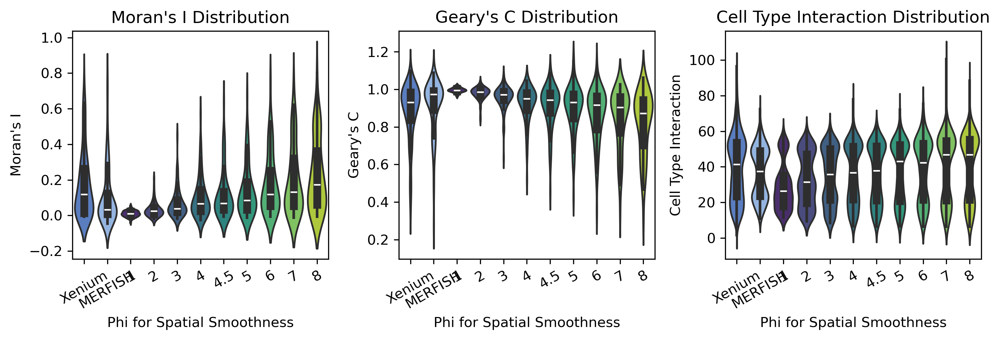

In [9]:
plt_data_mi = [
    Xenium_mi_sim, merfish_mi_sim, sim_phi_mi[0], sim_phi_mi[1], 
    sim_phi_mi[2], sim_phi_mi[3], sim_phi_mi[4], sim_phi_mi[5], 
    sim_phi_mi[6], sim_phi_mi[7], sim_phi_mi[8], 
]

plt_data_gc = [
    Xenium_gc_sim, merfish_gc_sim, sim_phi_gc[0], sim_phi_gc[1], 
    sim_phi_gc[2], sim_phi_gc[3], sim_phi_gc[4], sim_phi_gc[5], 
    sim_phi_gc[6], sim_phi_gc[7], sim_phi_gc[8], 
]

plt_data_ci = [
    Xenium_ci_sim, merfish_ci_sim, sim_phi_ci[0], sim_phi_ci[1], 
    sim_phi_ci[2], sim_phi_ci[3], sim_phi_ci[4], sim_phi_ci[5], 
    sim_phi_ci[6], sim_phi_ci[7], sim_phi_ci[8], 
]

fig, axs = plt.subplots(1, 3, figsize=(10, 3.5), dpi=300)
palette = sns.color_palette("muted", 11)
palette = list(palette)
first = np.array(palette[0])
# blend the first color toward a light blue and set as the second color
palette[1] = tuple(np.clip(first * 0.4 + np.array([0.7, 0.85, 1.0]) * 0.6, 0, 1))
palette[2:] =  sns.color_palette("viridis", 9)

# Prepare data for violin plots
labels = [
    "Xenium", "MERFISH", "1", "2", 
    "3", "4", "4.5", "5", 
    "6", "7", "8", 
]

# Panel 1: Moran's I
sns.violinplot(data=plt_data_mi, ax=axs[0], palette=palette)
axs[0].set_xticklabels(labels, rotation=30, ha='center')
axs[0].set_xlabel("Phi for Spatial Smoothness")
axs[0].set_ylabel("Moran's I")
axs[0].set_title("Moran's I Distribution")

# Panel 2: Geary's C
sns.violinplot(data=plt_data_gc, ax=axs[1], palette=palette)
axs[1].set_xticklabels(labels, rotation=30, ha='center')
axs[1].set_xlabel("Phi for Spatial Smoothness")
axs[1].set_ylabel("Geary's C")
axs[1].set_title("Geary's C Distribution")

# Panel 3: Cell Type Interaction
sns.violinplot(data=plt_data_ci, ax=axs[2], palette=palette)
axs[2].set_xticklabels(labels, rotation=30, ha='center')
axs[2].set_xlabel("Phi for Spatial Smoothness")
axs[2].set_ylabel("Cell Type Interaction")
axs[2].set_title("Cell Type Interaction Distribution")

plt.tight_layout()
plt.show()

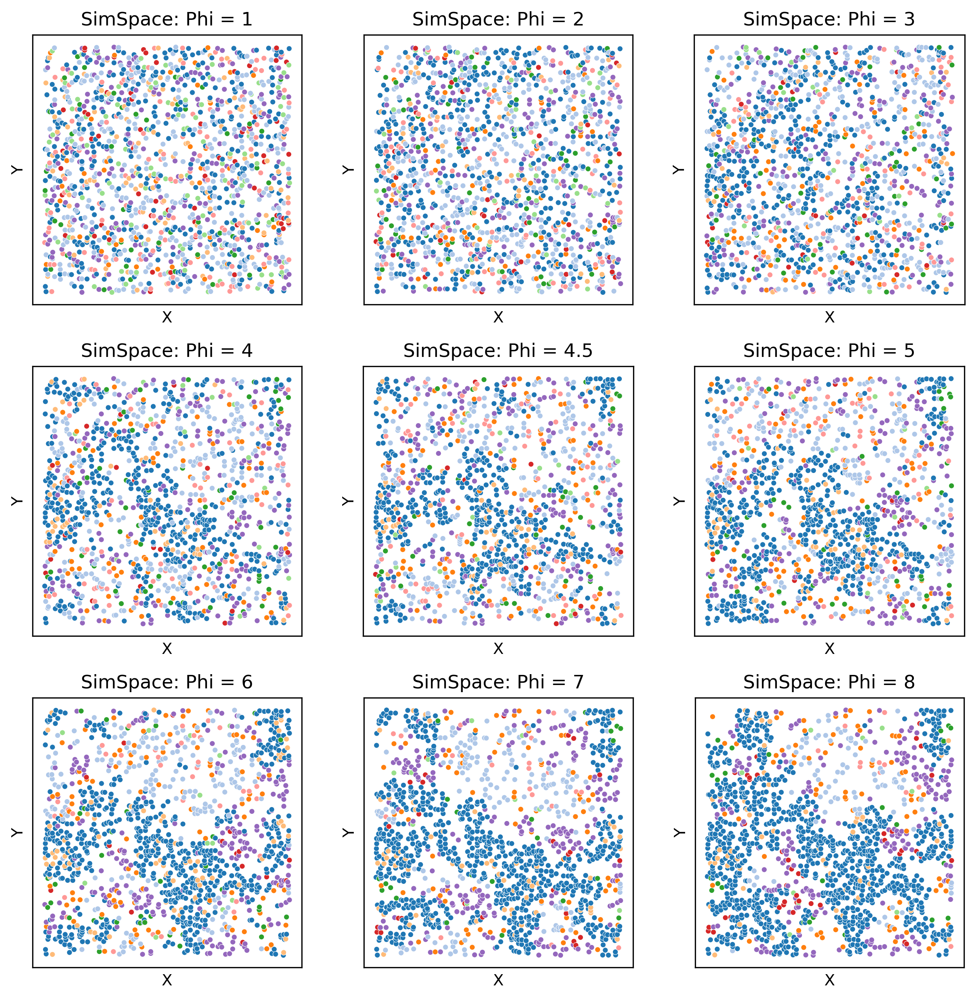

In [23]:
fig, axes = plt.subplots(3, 3, figsize=(9, 9), dpi=300)
axes = axes.flatten()

for i, phi in enumerate(phi_list):
    param = ss.util.generate_random_parameters(n_group=2, n_state=9, seed=0)
    param['phi_replicates'] = phi

    sim = ss.util.sim_from_params(
        param,
        shape=(100, 100),
        num_iteration=4,
        n_iter=6,
        custom_neighbor=ss.spatial.generate_offsets(3, 'manhattan'),
        seed=0
    )

    ax = axes[i]
    sns.scatterplot(
        x='row', y='col', data=sim.meta,
        hue='state', palette='tab20', legend=False, s=12, ax=ax
    )
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_aspect('equal')
    ax.set_title(f'SimSpace: Phi = {phi}')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

# Supp Fig. 3B: Sensitivity analysis on neighborhood structure size

In [10]:
def ss_statistics(
        shape = (100, 100), 
        n_group = 3, 
        n_state = 9, 
        num_iteration = 4, 
        n_iter = 6, 
        custom_neighbor = ss.spatial.generate_offsets(3, 'manhattan'),
        seed = 0,  
    ):
    param_1 = ss.util.generate_random_parameters(n_group=n_group, n_state=n_state, seed=seed)

    sim1 = ss.util.sim_from_params(
        param_1,
        shape=shape,
        num_iteration=num_iteration,
        n_iter=n_iter,
        custom_neighbor=custom_neighbor,
        seed=seed
    )  

    mi_sim = ss.spatial.integrate_morans_I(sim1.meta['state'], sim1.meta[['row', 'col']], sim1.meta['state'].unique().tolist())
    gc_sim = ss.spatial.integrate_gearys_C(sim1.meta['state'], sim1.meta[['row', 'col']], sim1.meta['state'].unique().tolist())
    ci_sim = ss.spatial.calculate_interaction_score(sim1.meta['state'], sim1.meta[['row', 'col']], sim1.meta['state'].unique().tolist())

    return [mi_sim, gc_sim, ci_sim]

In [11]:
neighborhood_sizes = [2, 3, 4, 5, 6, 7]
sim_neighbor_mi = [[] for _ in range(6)]
sim_neighbor_gc = [[] for _ in range(6)]
sim_neighbor_ci = [[] for _ in range(6)]

for i, neighborhood_size in enumerate(neighborhood_sizes):
    for j in range(8):
        ## SimSpace
        sim_stats = ss_statistics(
            shape=(100, 100), n_group=2, n_state=9, num_iteration=4, n_iter=6, 
            custom_neighbor=ss.spatial.generate_offsets(neighborhood_size, 'manhattan'), seed=j)
        sim_neighbor_mi[i].append(sim_stats[0])
        sim_neighbor_gc[i].append(sim_stats[1])
        sim_neighbor_ci[i].append(sim_stats[2].values.reshape(-1).tolist())
sim_neighbor_mi = [np.concatenate(item) for item in sim_neighbor_mi]
sim_neighbor_gc = [np.concatenate(item) for item in sim_neighbor_gc]
sim_neighbor_ci = [np.concatenate(item) for item in sim_neighbor_ci]

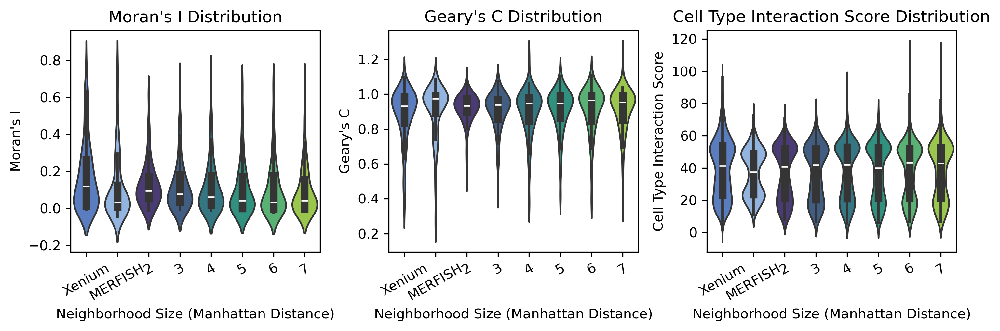

In [16]:
plt_data_mi = [
    Xenium_mi_sim, merfish_mi_sim, sim_neighbor_mi[0], sim_neighbor_mi[1], 
    sim_neighbor_mi[2], sim_neighbor_mi[3], sim_neighbor_mi[4], sim_neighbor_mi[5], 
]

plt_data_gc = [
    Xenium_gc_sim, merfish_gc_sim, sim_neighbor_gc[0], sim_neighbor_gc[1], 
    sim_neighbor_gc[2], sim_neighbor_gc[3], sim_neighbor_gc[4], sim_neighbor_gc[5], 
]

plt_data_ci = [
    Xenium_ci_sim, merfish_ci_sim, sim_neighbor_ci[0], sim_neighbor_ci[1], 
    sim_neighbor_ci[2], sim_neighbor_ci[3], sim_neighbor_ci[4], sim_neighbor_ci[5], 
]

# Prepare data for violin plots
labels = [
    "Xenium", "MERFISH", "2", 
    "3", "4", "5", "6", "7", 
]

fig, axs = plt.subplots(1, 3, figsize=(10, 3.5), dpi=300)
palette = sns.color_palette("muted", 11)
palette = list(palette)
first = np.array(palette[0])
# blend the first color toward a light blue and set as the second color
palette[1] = tuple(np.clip(first * 0.4 + np.array([0.7, 0.85, 1.0]) * 0.6, 0, 1))
palette[2:] =  sns.color_palette("viridis", 6)

# Panel 1: Moran's I
sns.violinplot(data=plt_data_mi, ax=axs[0], palette=palette)
axs[0].set_xticklabels(labels, rotation=30, ha='center')
axs[0].set_xlabel("Neighborhood Size (Manhattan Distance)")
axs[0].set_ylabel("Moran's I")
axs[0].set_title("Moran's I Distribution")

# Panel 2: Geary's C
sns.violinplot(data=plt_data_gc, ax=axs[1], palette=palette)
axs[1].set_xticklabels(labels, rotation=30, ha='center')
axs[1].set_xlabel("Neighborhood Size (Manhattan Distance)")
axs[1].set_ylabel("Geary's C")
axs[1].set_title("Geary's C Distribution")

# Panel 3: Cell Type Interaction
sns.violinplot(data=plt_data_ci, ax=axs[2], palette=palette)
axs[2].set_xticklabels(labels, rotation=30, ha='center')
axs[2].set_xlabel("Neighborhood Size (Manhattan Distance)")
axs[2].set_ylabel("Cell Type Interaction Score")
axs[2].set_title("Cell Type Interaction Score Distribution")

plt.tight_layout()
plt.show()

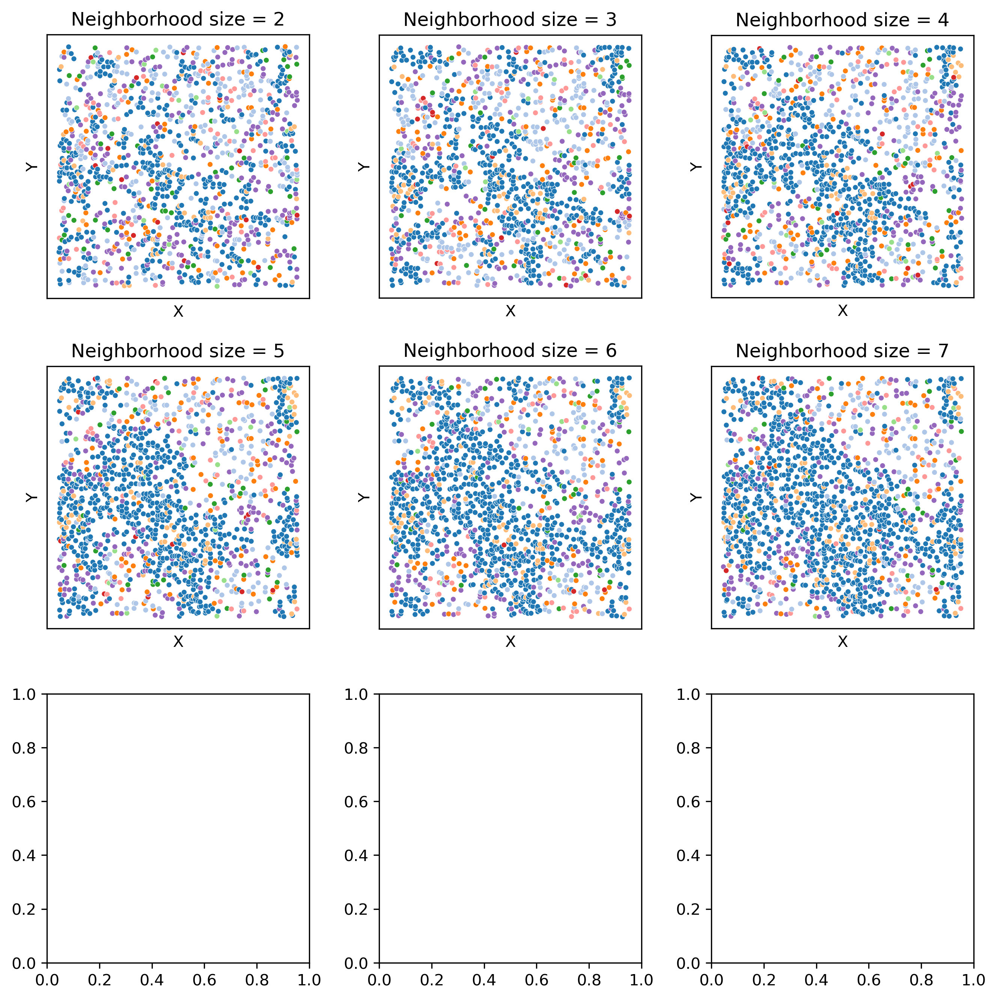

In [112]:
fig, axes = plt.subplots(3, 3, figsize=(9, 9), dpi=300)
axes = axes.flatten()

for i, neighborhood_size in enumerate(neighborhood_sizes):
    param = ss.util.generate_random_parameters(n_group=2, n_state=9, seed=0)
    sim = ss.util.sim_from_params(
        param,
        shape=(100, 100),
        num_iteration=4,
        n_iter=6,
        custom_neighbor=ss.spatial.generate_offsets(neighborhood_size, 'manhattan'),
        seed=0
    )

    ax = axes[i]
    sns.scatterplot(
        x='row', y='col', data=sim.meta,
        hue='state', palette='tab20', legend=False, s=12, ax=ax
    )
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_aspect('equal')
    ax.set_title(f'Neighborhood size = {neighborhood_size}')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

# Supp Fig. 3C: Sensitivity analysis on sigma perturbation

In [6]:
def ss_statistics(
        shape = (100, 100), 
        n_group = 3, 
        n_state = 9, 
        num_iteration = 4, 
        n_iter = 6, 
        sigma = 0,
        seed = 0,  
    ):
    param_1 = ss.util.generate_random_parameters(n_group=n_group, n_state=n_state, seed=seed)

    n_group = param_1['n_group']
    n_state = param_1['n_state']
    
    niche_theta = np.zeros((n_group, n_group))
    niche_theta[np.triu_indices(n_group, 1)] = param_1['niche_theta']
    niche_theta = niche_theta + niche_theta.T - np.diag(niche_theta.diagonal())
    np.fill_diagonal(niche_theta, 1)

    theta_list = []
    for i in range(n_group):
        theta_tmp = np.zeros((n_state, n_state))
        theta_tmp[np.triu_indices(n_state, 1)] = param_1['theta_list'][i]
        theta_tmp = theta_tmp + theta_tmp.T - np.diag(theta_tmp.diagonal())
        np.fill_diagonal(theta_tmp, 1)
        theta_list.append(theta_tmp)
    
    density_replicates = np.array(param_1['density_replicates'])
    density_replicates[density_replicates < 0] = 0
    phi_replicates = param_1['phi_replicates']

    Sim = ss.SimSpace(
        shape = shape,
        num_states = n_state,
        num_iterations= num_iteration,
        theta=theta_list,
        phi=phi_replicates,
        neighborhood=ss.spatial.generate_offsets(3, 'manhattan'), 
        random_seed=seed,
        )
    Sim.initialize()   # Initialize the grid
    Sim.create_niche(num_niches=n_group, n_iter=n_iter, theta_niche=niche_theta)
    Sim.gibbs_sampler()    # Gibbs sampling
    Sim.density_sampler(density_replicates)  # Cell density of each niche
    Sim.perturbation(step = sigma)     # Perturbation

    mi_sim = ss.spatial.integrate_morans_I(Sim.meta['state'], Sim.meta[['row', 'col']], Sim.meta['state'].unique().tolist())
    gc_sim = ss.spatial.integrate_gearys_C(Sim.meta['state'], Sim.meta[['row', 'col']], Sim.meta['state'].unique().tolist())
    ci_sim = ss.spatial.calculate_interaction_score(Sim.meta['state'], Sim.meta[['row', 'col']], Sim.meta['state'].unique().tolist())
    return [mi_sim, gc_sim, ci_sim]

In [19]:
sigma_list = [0, 0.2, 0.4, 0.6, 0.8, 1.0]
sim_neighbor_mi = [[] for _ in range(6)]
sim_neighbor_gc = [[] for _ in range(6)]
sim_neighbor_ci = [[] for _ in range(6)]

for i, sigma in enumerate(sigma_list):
    for j in range(8):
        ## SimSpace
        sim_stats = ss_statistics(
            shape=(100, 100), n_group=2, n_state=9, num_iteration=4, n_iter=6, 
            sigma=sigma, seed=j)
        sim_neighbor_mi[i].append(sim_stats[0])
        sim_neighbor_gc[i].append(sim_stats[1])
        sim_neighbor_ci[i].append(sim_stats[2].values.reshape(-1).tolist())
sim_neighbor_mi = [np.concatenate(item) for item in sim_neighbor_mi]
sim_neighbor_gc = [np.concatenate(item) for item in sim_neighbor_gc]
sim_neighbor_ci = [np.concatenate(item) for item in sim_neighbor_ci]

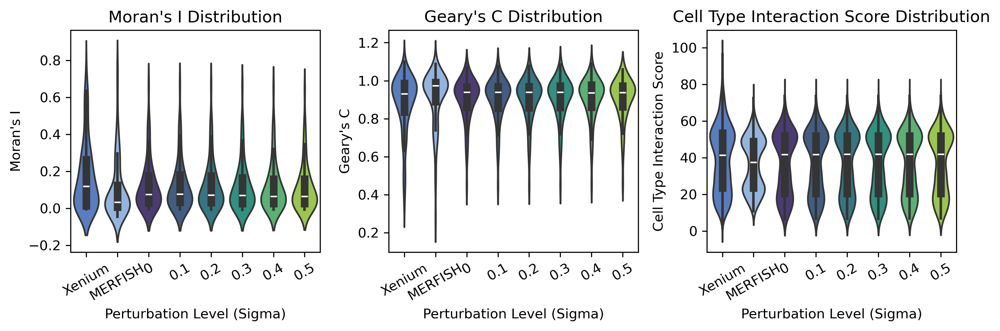

In [21]:
plt_data_mi = [
    Xenium_mi_sim, merfish_mi_sim, sim_neighbor_mi[0], sim_neighbor_mi[1], 
    sim_neighbor_mi[2], sim_neighbor_mi[3], sim_neighbor_mi[4], sim_neighbor_mi[5], 
]

plt_data_gc = [
    Xenium_gc_sim, merfish_gc_sim, sim_neighbor_gc[0], sim_neighbor_gc[1], 
    sim_neighbor_gc[2], sim_neighbor_gc[3], sim_neighbor_gc[4], sim_neighbor_gc[5], 
]

plt_data_ci = [
    Xenium_ci_sim, merfish_ci_sim, sim_neighbor_ci[0], sim_neighbor_ci[1], 
    sim_neighbor_ci[2], sim_neighbor_ci[3], sim_neighbor_ci[4], sim_neighbor_ci[5], 
]

# Prepare data for violin plots
labels = [
    "Xenium", "MERFISH", "0", 
    "0.1", "0.2", "0.3", "0.4", "0.5", 
]

fig, axs = plt.subplots(1, 3, figsize=(10, 3.5), dpi=300)
palette = sns.color_palette("muted", 11)
palette = list(palette)
first = np.array(palette[0])
# blend the first color toward a light blue and set as the second color
palette[1] = tuple(np.clip(first * 0.4 + np.array([0.7, 0.85, 1.0]) * 0.6, 0, 1))
palette[2:] =  sns.color_palette("viridis", 6)

# Panel 1: Moran's I
sns.violinplot(data=plt_data_mi, ax=axs[0], palette=palette)
axs[0].set_xticklabels(labels, rotation=30, ha='center')
axs[0].set_xlabel("Perturbation Level (Sigma)")
axs[0].set_ylabel("Moran's I")
axs[0].set_title("Moran's I Distribution")

# Panel 2: Geary's C
sns.violinplot(data=plt_data_gc, ax=axs[1], palette=palette)
axs[1].set_xticklabels(labels, rotation=30, ha='center')
axs[1].set_xlabel("Perturbation Level (Sigma)")
axs[1].set_ylabel("Geary's C")
axs[1].set_title("Geary's C Distribution")

# Panel 3: Cell Type Interaction
sns.violinplot(data=plt_data_ci, ax=axs[2], palette=palette)
axs[2].set_xticklabels(labels, rotation=30, ha='center')
axs[2].set_xlabel("Perturbation Level (Sigma)")
axs[2].set_ylabel("Cell Type Interaction Score")
axs[2].set_title("Cell Type Interaction Score Distribution")

plt.tight_layout()
plt.show()

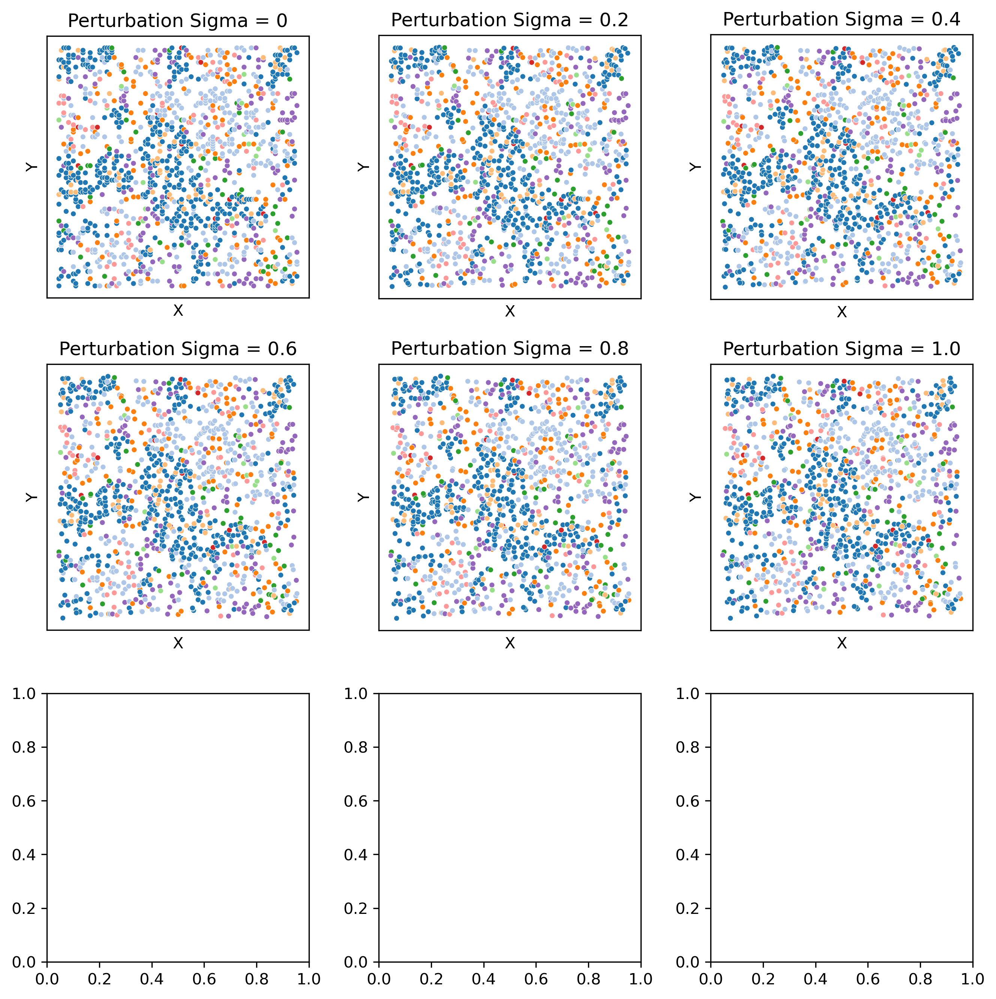

In [22]:
fig, axes = plt.subplots(3, 3, figsize=(9, 9), dpi=300)
axes = axes.flatten()

for j, sigma in enumerate(sigma_list):
    param_1 = ss.util.generate_random_parameters(n_group=2, n_state=9, seed=0)
    n_group = param_1['n_group']
    n_state = param_1['n_state'] 
    niche_theta = np.zeros((n_group, n_group))
    niche_theta[np.triu_indices(n_group, 1)] = param_1['niche_theta']
    niche_theta = niche_theta + niche_theta.T - np.diag(niche_theta.diagonal())
    np.fill_diagonal(niche_theta, 1)
    theta_list = []
    for i in range(n_group):
        theta_tmp = np.zeros((n_state, n_state))
        theta_tmp[np.triu_indices(n_state, 1)] = param_1['theta_list'][i]
        theta_tmp = theta_tmp + theta_tmp.T - np.diag(theta_tmp.diagonal())
        np.fill_diagonal(theta_tmp, 1)
        theta_list.append(theta_tmp)
    
    density_replicates = np.array(param_1['density_replicates'])
    density_replicates[density_replicates < 0] = 0
    phi_replicates = param_1['phi_replicates']

    Sim = ss.SimSpace(
        shape = (100, 100),
        num_states = n_state,
        num_iterations= 6,
        theta=theta_list,
        phi=phi_replicates,
        neighborhood=ss.spatial.generate_offsets(3, 'manhattan'), 
        random_seed=0,
        )
    Sim.initialize()   # Initialize the grid
    Sim.create_niche(num_niches=n_group, n_iter=6, theta_niche=niche_theta)
    Sim.gibbs_sampler()    # Gibbs sampling
    Sim.density_sampler(density_replicates)  # Cell density of each niche
    Sim.perturbation(step = sigma)     # Perturbation

    ax = axes[j]
    sns.scatterplot(
        x='row', y='col', data=Sim.meta,
        hue='state', palette='tab20', legend=False, s=12, ax=ax
    )
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_aspect('equal')
    ax.set_title(f'Perturbation Sigma = {sigma}')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

# Supp Fig. 4A: BANKSY Clusters for Xenium & sccube

In [6]:
bank_xenium_domain = pd.read_csv('../fig_data/clustering/BANKSY_xenium_domain.csv')

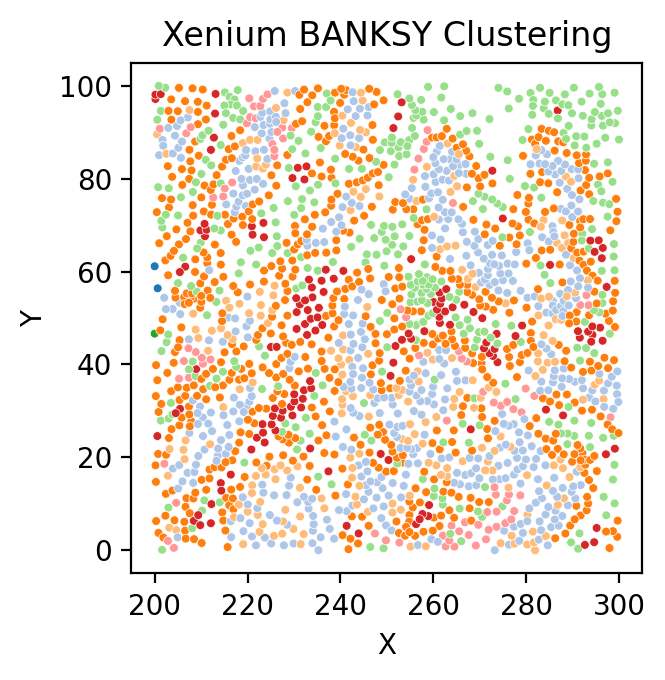

In [14]:
plt.figure(figsize=(5, 3.5), dpi = 200)
sns.scatterplot(x='row', y='col', data=bank_xenium_domain, hue='UMAP1_cluster', palette='tab20', legend=True, s=10)
plt.xlabel('X')
plt.ylabel('Y')
plt.gca().set_aspect('equal')
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend([], [], frameon=False)
plt.title('Xenium BANKSY Clustering')
plt.tight_layout()
plt.show()

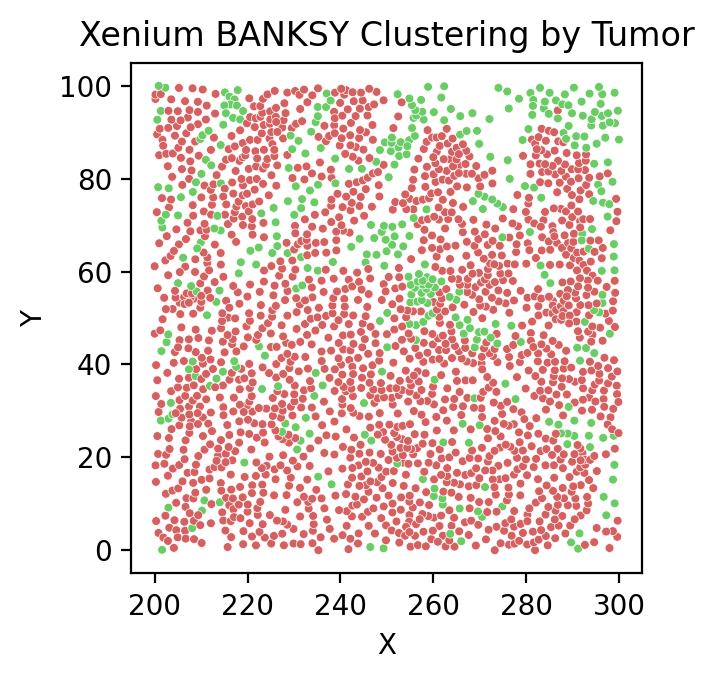

In [15]:
palette = sns.color_palette("muted", 10)
palette[0] = palette[2]
palette[1] = palette[3]
plt.figure(figsize=(5, 3.5), dpi = 200)
sns.scatterplot(x='row', y='col', data=bank_xenium_domain, hue='Tumor_label', palette=palette, legend=True, s=10)
plt.xlabel('X')
plt.ylabel('Y')
plt.gca().set_aspect('equal')
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend([], [], frameon=False)
plt.title('Xenium BANKSY Clustering by Tumor')
plt.tight_layout()
plt.show()

# Supp Fig. 4D: fraction of zeros per gene & mean variance relationship

In [ ]:
ss_count = pd.read_csv('../fig_data/clustering/simspace_count.csv', index_col=0)
sccube_count = pd.read_csv('../fig_data/clustering/sccube_count.csv', index_col=0)
sccube_count = sccube_count.T
xenium_count = pd.read_csv('../data/reference_count.csv', index_col=0)
xenium_count = xenium_count.T

Correlations (mean vs variance, mean vs fraction zeros):
  SimSpace: mean-variance 0.9368, mean-frac_zero -0.7436
  Xenium: mean-variance 0.9348, mean-frac_zero -0.7355
  scCube: mean-variance 0.6295, mean-frac_zero -0.9091


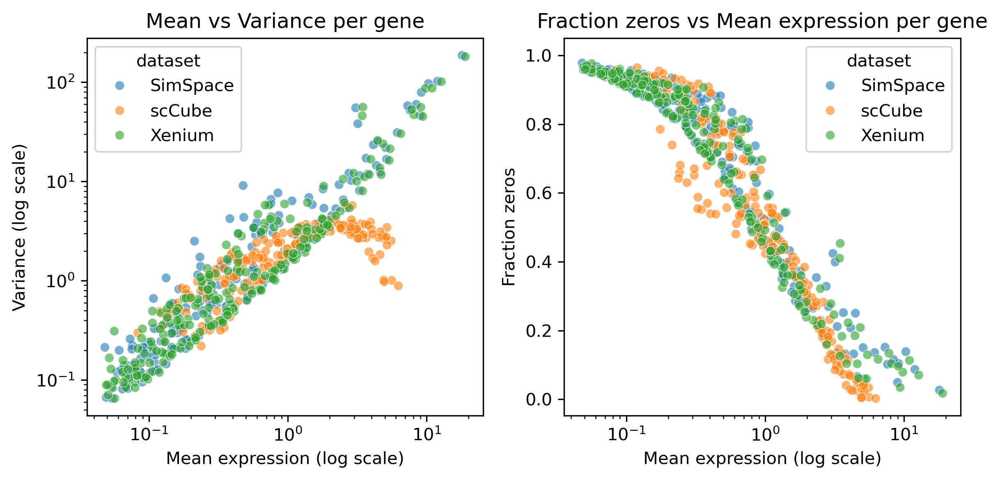

,mean,variance,frac_zero,dataset
gene,,,,
AIF1,0.432301,1.204416,0.779325,SimSpace
KRT7,11.975983,102.265788,0.087017,SimSpace
DPT,0.104072,0.226282,0.933867,SimSpace
ENAH,2.638009,5.433680,0.182040,SimSpace
RTKN2,0.381483,0.966537,0.779673,SimSpace


In [ ]:
# Compute fraction zeros, mean and variance per gene for the three datasets and plot relationships

# Use the intersection of genes present in all three datasets
common_genes = list(set(ss_count.columns) & set(sccube_count.columns) & set(xenium_count.columns))
ss_sub = ss_count[common_genes]
sccube_sub = sccube_count[common_genes]
xenium_sub = xenium_count[common_genes]

def gene_metrics(df, label):
    # df: genes in columns, cells/samples in rows
    means = df.mean(axis=0)
    variances = df.var(axis=0, ddof=1)
    frac_zero = (df == 0).sum(axis=0) / df.shape[0]
    out = pd.DataFrame({
        'gene': means.index,
        'mean': means.values,
        'variance': variances.values,
        'frac_zero': frac_zero.values,
        'dataset': label
    }).set_index('gene')
    return out

metrics_ss = gene_metrics(ss_sub, 'SimSpace')
metrics_sccube = gene_metrics(sccube_sub, 'scCube')
metrics_xenium = gene_metrics(xenium_sub, 'Xenium')

metrics = pd.concat([metrics_ss, metrics_sccube, metrics_xenium])

# Summary correlations (mean vs variance, mean vs frac_zero) per dataset
corrs = {}
for name, grp in metrics.groupby('dataset'):
    # handle potential constant series by checking std
    mean_var_corr = np.nan
    mean_fzero_corr = np.nan
    if grp['mean'].std() > 0 and grp['variance'].std() > 0:
        mean_var_corr = np.corrcoef(grp['mean'], grp['variance'])[0,1]
    if grp['mean'].std() > 0 and grp['frac_zero'].std() > 0:
        mean_fzero_corr = np.corrcoef(grp['mean'], grp['frac_zero'])[0,1]
    corrs[name] = {'mean_vs_variance': mean_var_corr, 'mean_vs_frac_zero': mean_fzero_corr}

print("Correlations (mean vs variance, mean vs fraction zeros):")
for k,v in corrs.items():
    print(f"  {k}: mean-variance {v['mean_vs_variance']:.4f}, mean-frac_zero {v['mean_vs_frac_zero']:.4f}")

# Plots: mean vs variance (log-log) and fraction zeros vs mean (log-x)
fig, axs = plt.subplots(1, 2, figsize=(8,4), dpi=300)

# Add a small offset to avoid log(0)
eps = 1e-6
sns.scatterplot(data=metrics.reset_index(), x='mean', y='variance', hue='dataset', ax=axs[0], s=30, alpha=0.6)
axs[0].set_xscale('log')
axs[0].set_yscale('log')
axs[0].set_xlabel('Mean expression (log scale)')
axs[0].set_ylabel('Variance (log scale)')
axs[0].set_title('Mean vs Variance per gene')

sns.scatterplot(data=metrics.reset_index(), x='mean', y='frac_zero', hue='dataset', ax=axs[1], s=30, alpha=0.6)
axs[1].set_xscale('log')
axs[1].set_xlabel('Mean expression (log scale)')
axs[1].set_ylabel('Fraction zeros')
axs[1].set_title('Fraction zeros vs Mean expression per gene')
plt.tight_layout()
plt.show()

# Return the metrics dataframe for further inspection if needed
metrics.head()

# Additional Figure 1: k in MI calculation

In [13]:
import libpysal
from libpysal.weights import KNN
from esda.moran import Moran

def ss_kNN(
        shape = (100, 100), 
        n_group = 3, 
        n_state = 9, 
        num_iteration = 4, 
        n_iter = 6, 
        custom_neighbor = ss.spatial.generate_offsets(3, 'manhattan'),
        seed = 0,   
        k = 5,
    ):
    param_1 = ss.util.generate_random_parameters(n_group=n_group, n_state=n_state, seed=seed)
    sim1 = ss.util.sim_from_params(
        param_1,
        shape=shape,
        num_iteration=num_iteration,
        n_iter=n_iter,
        custom_neighbor=custom_neighbor,
        seed=seed
    )  

    mi_sim = []
    for type in sim1.meta['state'].unique().tolist():
        tmp = sim1.meta['state'] == type
        kd = libpysal.cg.KDTree(sim1.meta[['row', 'col']])
        weights = KNN(kd, k=k)
        # Calculate Moran's I
        morans_I = Moran(tmp, weights)
        mi_sim.append(morans_I.I)

    return mi_sim

In [21]:
k_list = [5, 10, 15, 20, 25, 30]
sim_phi_mi = [[] for _ in range(6)]
    
for i in range(6):
    for j in range(4):
        ## SimSpace
        sim_stats = ss_kNN(
            shape=(70, 70), n_group=2, n_state=7, num_iteration=4, n_iter=6, 
            custom_neighbor=ss.spatial.generate_offsets(3, 'manhattan'), seed=j,
            k=k_list[i])
        sim_phi_mi[i].append(sim_stats)

sim_phi_mi = [np.concatenate(item) for item in sim_phi_mi]

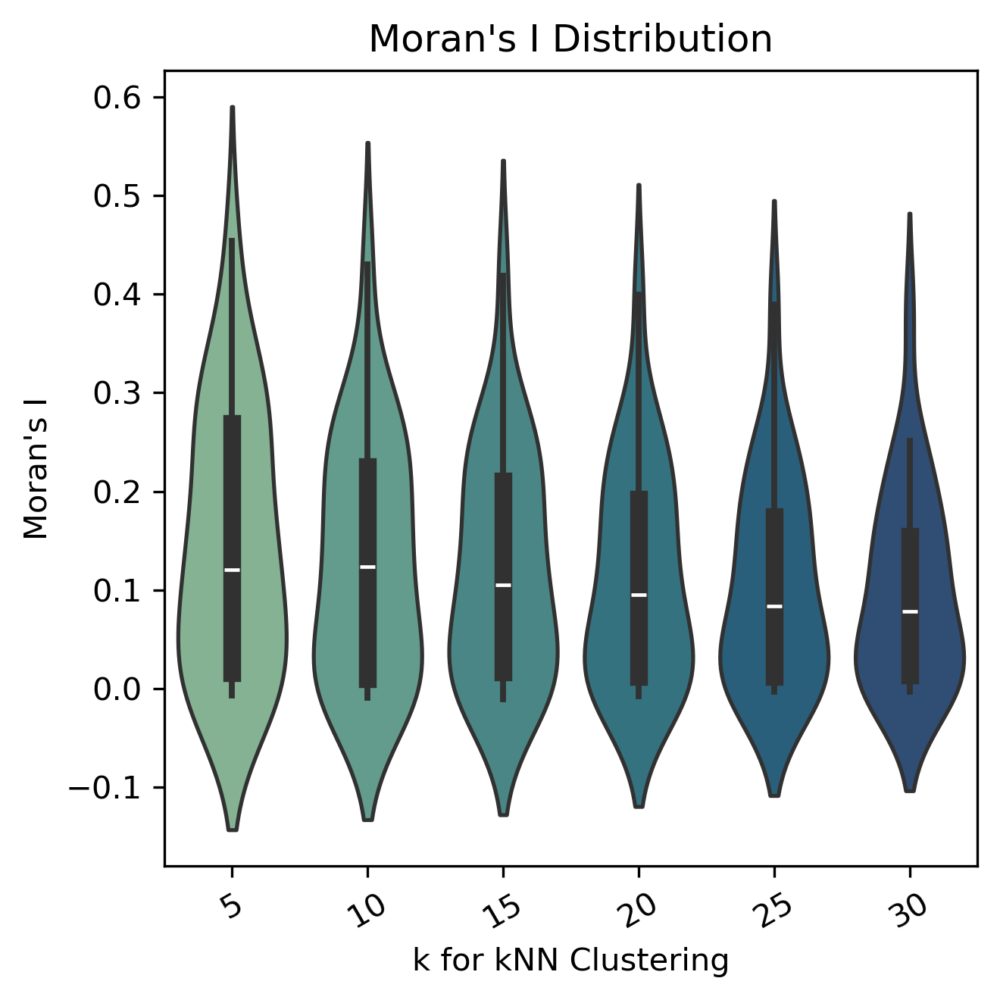

In [24]:
plt_data_mi = [
    # Xenium_mi_sim, merfish_mi_sim, 
    sim_phi_mi[0], sim_phi_mi[1], 
    sim_phi_mi[2], sim_phi_mi[3], sim_phi_mi[4], sim_phi_mi[5]
]


# fig, axs = plt.subplots(1, 1, figsize=(4.5, 4.5), dpi=300)
fig,ax = plt.subplots(figsize=(4.5, 4.5), dpi=300)
# palette = sns.color_palette("muted", 11)
# palette = list(palette)
# first = np.array(palette[0])
# # blend the first color toward a light blue and set as the second color
# palette[1] = tuple(np.clip(first * 0.4 + np.array([0.7, 0.85, 1.0]) * 0.6, 0, 1))
# palette[2:] =  sns.color_palette("viridis", 6)

labels = [
    # "Xenium", "MERFISH", 
    "5", "10", "15", "20", "25", "30"
]

# Panel 1: Moran's I
sns.violinplot(data=plt_data_mi, palette=sns.color_palette("crest", 6), ax=ax)
ax.set_xticklabels(labels, rotation=30, ha='center')
ax.set_xlabel("k for kNN Clustering")
ax.set_ylabel("Moran's I")
ax.set_title("Moran's I Distribution")

plt.tight_layout()
plt.show()